In [4]:
def load_data(edges_path, dates_path):
    """
    Loads data from files into the graph and dates dictionary.

    Args:
        edges_path (str): Path to the file containing citation edges.
        dates_path (str): Path to the file containing publication dates.
    """
    # Load citation relationships
    # with open(edges_path, 'r') as file:
    #     for line in file:
    #         if line[0] != '#':
    #             from_node, to_node = line.strip().split()
    #             print(from_node, to_node)
                # graph.add_edge(from_node, to_node)

    # # Load publication dates
    # with open(dates_path, 'r') as file:
    #     for line in file:
    #         if line[0] != '#':
    #             node, date = line.strip().split()
    #             self.dates[node] = datetime.strptime(date, '%Y-%m-%d')

In [5]:
load_data('./data/Cit-HepPh.txt', './data/cit-HepPh-dates.txt')

9907233 9301253
9907233 9504304
9907233 9505235
9907233 9506257
9907233 9606402
9907233 9607354
9907233 9611297
9907233 9702314
9907233 9704296
9907233 9803214
9907233 9903217
9704296 9311274
9704296 9502335
9704296 9606402
9704296 9607354
9704296 9611296
9704296 9611297
9704296 9612258
9606402 9301203
9606402 9301206
9606402 9502274
9606402 9503474
9606402 9505235
9607354 9504304
9607354 9505235
9607354 9606402
9702314 9302247
9702314 9501357
9702314 9501384
9702314 9502366
9702314 9504372
9702314 9511210
9702314 9610453
9803214 9301253
9803214 9702314
9803214 9706487
9506257 9311274
9611297 9211239
9611297 9302217
9611297 9405341
9611297 9409335
9611297 9409371
9611297 9411285
9611297 9504304
9611297 9505235
9611297 9508393
9611297 9602366
9611297 9606210
9611297 9610360
9903217 9301253
9903217 9502366
9903217 9605245
9903217 9610282
9903217 9702314
9903217 9803214
9903217 9803242
9903217 9804209
9903217 9805334
112133 2171
112133 12308
112133 104062
112133 104110
112133 112008
11213

In [2]:
import networkx as nx
import matplotlib.pyplot as plt
def visualize_graph(graph):
    """
    Visualizes the given graph using matplotlib.

    Args:
        graph (nx.DiGraph): The graph to visualize.
    """
    plt.figure(figsize=(12, 12))  # Set the size of the figure
    pos = nx.spring_layout(graph, seed=42)  # Positions for all nodes
    nx.draw(graph, pos, with_labels=False, node_size=10, alpha=0.3, arrows=True)
    plt.title('Citation Network Visualization')
    plt.show()

KeyboardInterrupt: 

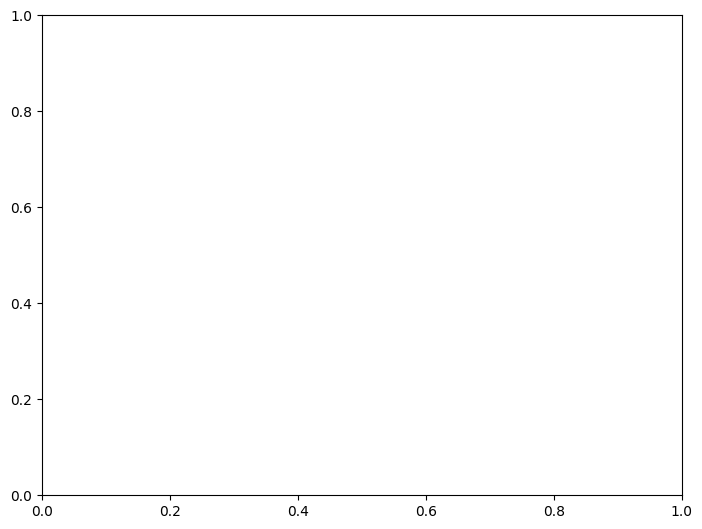

In [8]:
from data_loader import DataLoader
from graph_analyzer import GraphAnalyzer
from plotter import Plotter

graph = DataLoader.load_edges('./data/Cit-HepPh.txt')
nx.draw(graph, with_labels=True)
plt.show()

In [22]:
import networkx as nx
from collections import defaultdict

class GraphAnalyzer:
    """
    Performs various analyses on a set of cumulative year-wise graphs.
    """

    def __init__(self, graph, dates):
        """
        Initialize the GraphAnalyzer with a graph and associated dates.

        Args:
            graph (nx.DiGraph): The graph to analyze.
            dates (dict): A dictionary mapping node IDs to publication dates.
        """
        graph = graph
        dates = dates
         yearly_graphs = self.build_yearly_graphs()

    def build_yearly_graphs(self):
        """
        Constructs cumulative graphs for each year.

        Returns:
            dict: A dictionary of graphs keyed by year.
        """
        yearly_graphs = {}
        sorted_dates = sorted(self.dates.items(), key=lambda x: x[1])
        current_graph = nx.DiGraph()

        for node, date in sorted_dates:
            year = date.year
            if year not in yearly_graphs:
                if year > 1993:
                    yearly_graphs[year] = current_graph.copy()
            current_graph.add_node(node)
            for successor in graph.successors(node):
                if successor in dates and dates[successor] <= date:
                    current_graph.add_edge(node, successor)

        # Ensure the last year is also included
        yearly_graphs[year] = current_graph

        return yearly_graphs

    def analyze_yearly_graphs(self):
        """
        Analyzes the graphs for each year, computing various network properties.

        Returns:
            dict: A dictionary containing lists of graph properties for each year.
        """
        properties = defaultdict(lambda: defaultdict(list))

        for year, graph in self.yearly_graphs.items():
            properties['year'].append(year)
            properties['density'].append(nx.density(graph))
            properties['average_clustering'].append(nx.average_clustering(graph))
            properties['number_connected_components'].append(nx.number_weakly_connected_components(graph))
            properties['average_degree_centrality'].append(self.average_metric(nx.degree_centrality, graph))
            properties['average_betweenness_centrality'].append(self.average_metric(nx.betweenness_centrality, graph))
            properties['average_closeness_centrality'].append(self.average_metric(nx.closeness_centrality, graph))
            properties['average_eigenvector_centrality'].append(self.average_metric(nx.eigenvector_centrality_numpy, graph))
            properties['average_pagerank'].append(self.average_metric(nx.pagerank, graph))
            properties['assortativity'].append(nx.degree_assortativity_coefficient(graph))
            mod = self.calculate_modularity(graph)
            properties['modularity'].append(mod if mod is not None else 0)

            try:
                properties['diameter'].append(nx.diameter(graph))
            except:
                properties['diameter'].append(float('inf'))  # Graph is not fully connected

        return properties

    @staticmethod
    def average_metric(metric_func, graph):
        """
        Calculates the average value of a given centrality metric for the graph.
        Args:
            metric_func (function): A NetworkX function to compute centrality.
            graph (nx.Graph): The graph on which to compute the centrality.
        Returns:
            float: The average centrality value.
        """
        metrics = metric_func(graph)
        return sum(metrics.values()) / len(metrics)

    @staticmethod
    def calculate_modularity(graph):
        """
        Calculates the modularity of the largest connected component of the graph.
        Args:
            graph (nx.Graph): The graph to calculate modularity for.
        Returns:
            float: The modularity value, or None if not applicable.
        """
        if graph.number_of_nodes() == 0:
            return None
        components = nx.connected_components(graph.to_undirected())
        largest_component = max(components, key=len)
        subgraph = graph.subgraph(largest_component)
        communities = nx.community.greedy_modularity_communities(subgraph)
        return nx.community.modularity(subgraph, communities)


In [24]:
def build_yearly_graphs(dates, graph):
    """
    Constructs cumulative graphs for each year.

    Returns:
        dict: A dictionary of graphs keyed by year.
    """
    yearly_graphs = {}
    sorted_dates = sorted(dates.items(), key=lambda x: x[1])
    current_graph = nx.DiGraph()

    for node, date in sorted_dates:
        year = date.year
        if year not in yearly_graphs:
            if year > 1993:
                yearly_graphs[year] = current_graph.copy()
        current_graph.add_node(node)
        for successor in graph.successors(node):
            if successor in dates and dates[successor] <= date:
                current_graph.add_edge(node, successor)

    # Ensure the last year is also included
    yearly_graphs[year] = current_graph

    return yearly_graphs

In [25]:
from data_loader import DataLoader
# from graph_analyzer import GraphAnalyzer
from plotter import Plotter

graph = DataLoader.load_edges('./data/Cit-HepPh.txt')
dates = DataLoader.load_dates('./data/cit-HepPh-dates.txt')

In [28]:
print(graph)

DiGraph with 34546 nodes and 421578 edges


In [34]:
print(dates.values())

dict_values([datetime.datetime(1992, 2, 24, 0, 0), datetime.datetime(1992, 3, 8, 0, 0), datetime.datetime(1992, 3, 3, 0, 0), datetime.datetime(1992, 3, 9, 0, 0), datetime.datetime(1992, 3, 9, 0, 0), datetime.datetime(1992, 3, 9, 0, 0), datetime.datetime(1992, 3, 10, 0, 0), datetime.datetime(1992, 3, 10, 0, 0), datetime.datetime(1992, 3, 11, 0, 0), datetime.datetime(1992, 3, 15, 0, 0), datetime.datetime(1992, 3, 16, 0, 0), datetime.datetime(1992, 3, 16, 0, 0), datetime.datetime(1992, 3, 17, 0, 0), datetime.datetime(1992, 3, 16, 0, 0), datetime.datetime(1992, 3, 18, 0, 0), datetime.datetime(1992, 3, 18, 0, 0), datetime.datetime(1992, 3, 18, 0, 0), datetime.datetime(1992, 3, 19, 0, 0), datetime.datetime(1992, 3, 24, 0, 0), datetime.datetime(1992, 3, 26, 0, 0), datetime.datetime(1992, 3, 26, 0, 0), datetime.datetime(1992, 3, 27, 0, 0), datetime.datetime(1992, 3, 29, 0, 0), datetime.datetime(1992, 3, 30, 0, 0), datetime.datetime(1992, 3, 30, 0, 0), datetime.datetime(1992, 3, 31, 0, 0), date

In [36]:
def get_yearly_graphs(graph, dates, start_year, end_year):
    """
    Generate yearly graphs based on publication dates.

    Args:
        graph (nx.DiGraph): The original directed graph.
        dates (dict): Dictionary mapping paper IDs to publication dates.
        start_year (int): The starting year.
        end_year (int): The ending year.

    Returns:
        dict: A dictionary where keys are years and values are corresponding graphs.
    """
    yearly_graphs = {}
    for year in range(start_year, end_year + 1):
        filtered_graph = nx.DiGraph()
        for from_node, to_node in graph.edges():
            from_date = dates.get(from_node, None)
            to_date = dates.get(to_node, None)
            if from_date is not None and from_date.year <= year and \
               to_date is not None and to_date.year <= year:
                filtered_graph.add_edge(from_node, to_node)
        yearly_graphs[year] = filtered_graph
    return yearly_graphs

# Example usage
start_year = 1993
end_year = 2003

yearly_graphs = get_yearly_graphs(graph, dates, start_year, end_year)

# Now you have yearly graphs from 1993 to 2003
# You can visualize them or perform further analysis as needed


In [45]:
print(yearly_graphs[2002])

DiGraph with 21550 nodes and 201300 edges


In [41]:
print(yearly_graphs[1993])

DiGraph with 1504 nodes and 2862 edges


In [42]:
print(yearly_graphs[1994])

DiGraph with 3850 nodes and 11379 edges


In [43]:
print(yearly_graphs[1995])

DiGraph with 6827 nodes and 29808 edges


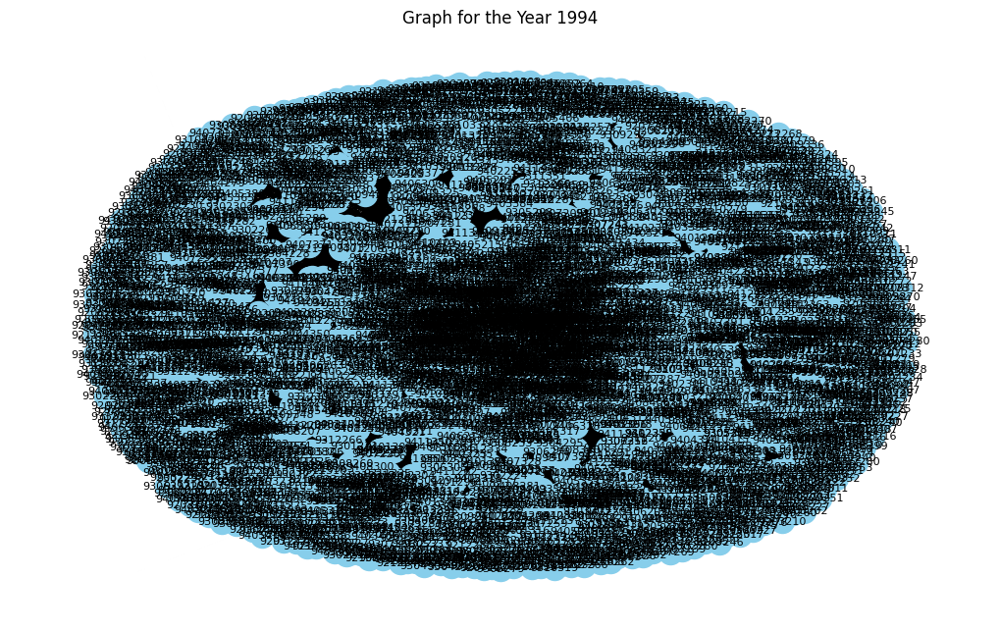

In [39]:
def visualize_yearly_graph(yearly_graphs, year):
    """
    Visualize a graph for a particular year.

    Args:
        yearly_graphs (dict): Dictionary where keys are years and values are corresponding graphs.
        year (int): The year for which the graph needs to be visualized.
    """
    graph = yearly_graphs.get(year, None)
    if graph is None:
        print("No graph available for the specified year.")
        return

    plt.figure(figsize=(10, 6))
    pos = nx.spring_layout(graph)  # Positions for all nodes
    nx.draw(graph, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8)
    plt.title(f"Graph for the Year {year}")
    plt.show()

# Example usage
visualize_yearly_graph(yearly_graphs, 1994)

In [27]:
yg = build_yearly_graphs(dates, graph)

NetworkXError: The node 9203204 is not in the digraph.

In [26]:
analyzer = GraphAnalyzer(graph, dates)

NetworkXError: The node 9203204 is not in the digraph.

In [ ]:
print(analyzer.yearly_graphs)

AttributeError: 'GraphAnalyzer' object has no attribute 'yearly_graphs'

In [1]:
import networkx as nx

def load_graph(edges_file, dates_file):
    """
    Loads the graph from edges and dates files.

    Args:
        edges_file (str): Path to the file containing the graph edges.
        dates_file (str): Path to the file containing the publication dates.

    Returns:
        nx.DiGraph: The directed graph with nodes annotated with publication dates.
    """
    graph = nx.DiGraph()
    dates = {}

    # Load dates from the dates file
    with open(dates_file, 'r') as file:
        for line in file:
            if line.startswith('#'):
                continue
            parts = line.strip().split()
            paper_id = parts[0]
            date = parts[1]
            dates[paper_id] = date

    # Load the graph
    with open(edges_file, 'r') as file:
        for line in file:
            if line.startswith('#'):
                continue
            from_node, to_node = line.strip().split()
            if from_node in dates and to_node in dates:  # Ensure both nodes have dates
                if from_node not in graph:
                    graph.add_node(from_node, date=dates[from_node])
                if to_node not in graph:
                    graph.add_node(to_node, date=dates[to_node])
                graph.add_edge(from_node, to_node)

    return graph

In [2]:
graph = load_graph('./data/Cit-HepPh.txt', './data/cit-HepPh-dates.txt')
print(graph)

DiGraph with 21550 nodes and 201300 edges


In [53]:
%pip install community

  Using cached community-1.0.0b1-py3-none-any.whl
Note: you may need to restart the kernel to use updated packages.


In [3]:
def get_yearly_graphs(graph):
    """
    Generate yearly cumulative graphs based on publication dates stored in node attributes.
    """
    # Extract years from node date attributes
    years = [int(graph.nodes[node]['date'].split('-')[0]) for node in graph]
    start_year, end_year = min(years), max(years)

    yearly_graphs = {}
    for year in range(start_year, end_year + 1):
        filtered_graph = nx.DiGraph()
        for node in graph:
            node_date = int(graph.nodes[node]['date'].split('-')[0])
            if node_date <= year:
                for to_node in graph.successors(node):
                    to_node_date = int(graph.nodes[to_node]['date'].split('-')[0])
                    if to_node_date <= year:
                        filtered_graph.add_edge(node, to_node)

        yearly_graphs[year] = filtered_graph

    return yearly_graphs

In [4]:
yg = get_yearly_graphs(graph)

In [59]:
print(yg)

{1992: <networkx.classes.digraph.DiGraph object at 0x00000179F66AEA80>, 1993: <networkx.classes.digraph.DiGraph object at 0x00000179F700A510>, 1994: <networkx.classes.digraph.DiGraph object at 0x00000179F73805F0>, 1995: <networkx.classes.digraph.DiGraph object at 0x00000179F73812B0>, 1996: <networkx.classes.digraph.DiGraph object at 0x00000179F66ACEF0>, 1997: <networkx.classes.digraph.DiGraph object at 0x00000179F700AFF0>, 1998: <networkx.classes.digraph.DiGraph object at 0x00000179F700B5C0>, 1999: <networkx.classes.digraph.DiGraph object at 0x00000179F700AB40>}


In [67]:
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# def detect_communities_louvain(graph):
#     # Community detection with the Louvain method
#     partition = community_louvain.best_partition(graph)
#     return partition

def detect_communities_girvan_newman(graph):
    # Community detection with the Girvan-Newman method
    communities_generator = nx.community.girvan_newman(graph)
    top_level_communities = next(communities_generator)
    return sorted(map(sorted, top_level_communities))

# Assuming 'graph' is your networkx graph object at time T
# partition_louvain = detect_communities_louvain(graph)
partition_girvan_newman = detect_communities_girvan_newman(yg[1993])

In [68]:
print(len(partition_girvan_newman))

80


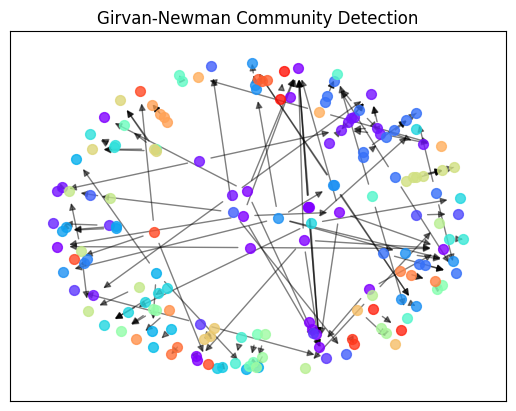

In [66]:
import networkx as nx
import matplotlib.pyplot as plt

def plot_communities(graph, communities):
    # Generate a color map, one color for each community
    colors = plt.cm.rainbow([i / len(communities) for i in range(len(communities))])
    
    pos = nx.spring_layout(graph)  # positions for all nodes
    
    for community, color in zip(communities, colors):
        nx.draw_networkx_nodes(graph, pos, nodelist=community, node_color=[color], node_size=50, alpha=0.8)
    
    nx.draw_networkx_edges(graph, pos, width=1.0, alpha=0.5)
    plt.title('Girvan-Newman Community Detection')
    plt.show()

# Assuming 'graph' is your NetworkX graph object and 'partition_girvan_newman' is the output from the community detection function
plot_communities(yg[1992], partition_girvan_newman)

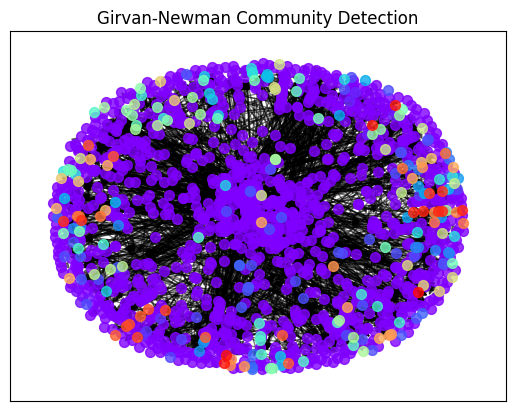

In [69]:
import networkx as nx
import matplotlib.pyplot as plt

def plot_communities(graph, communities):
    # Generate a color map, one color for each community
    colors = plt.cm.rainbow([i / len(communities) for i in range(len(communities))])
    
    pos = nx.spring_layout(graph)  # positions for all nodes
    
    for community, color in zip(communities, colors):
        nx.draw_networkx_nodes(graph, pos, nodelist=community, node_color=[color], node_size=50, alpha=0.8)
    
    nx.draw_networkx_edges(graph, pos, width=1.0, alpha=0.5)
    plt.title('Girvan-Newman Community Detection')
    plt.show()

# Assuming 'graph' is your NetworkX graph object and 'partition_girvan_newman' is the output from the community detection function
plot_communities(yg[1993], partition_girvan_newman)

In [5]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

def girvan_newman(graph, num_communities=2):
    # This generator will yield sets of communities at each iteration
    communities_generator = nx.community.girvan_newman(graph)
    # We'll take the communities after a certain number of iterations, let's say until we have num_communities
    for communities in communities_generator:
        if len(communities) >= num_communities:
            return communities

def plot_communities(graph, communities, save_path=None):
    plt.figure(figsize=(26, 18))  # Larger figure size for clarity
    # Create a base spring layout
    pos = nx.spring_layout(graph, scale=20.0)  # Scale to spread nodes within each community

    # Adjusting positions so that each community forms a cluster
    community_pos = {}
    for idx, community in enumerate(communities):
        angle = 2 * np.pi * idx / len(communities)  # Angle to position this community's center point
        center = np.array([np.cos(angle), np.sin(angle)]) * 10  # Center points spread in a circle

        subgraph = graph.subgraph(community)
        sub_pos = nx.spring_layout(subgraph)  # Position subgraph

        for node, pos in sub_pos.items():
            community_pos[node] = pos * 2 + center  # Scale and shift positions

    colors = plt.cm.rainbow(np.linspace(0, 1, len(communities)))
    for community, color in zip(communities, colors):
        nx.draw_networkx_nodes(graph, community_pos, nodelist=community, node_color=[color], node_size=100, alpha=0.8)
    
    nx.draw_networkx_edges(graph, community_pos, alpha=0.3)
    plt.title('Community Structure Detected by Girvan-Newman Algorithm')
    plt.axis('off')  # Turn off the axis

    # If a save path is provided, save the plot to a file
    if save_path:
        plt.savefig(save_path, format='png', dpi=300)  # Save as PNG with high resolution
        plt.close()  # Close the plot after saving to free up memory
    else:
        plt.show()  # Show the plot if not saving
for i in range(1994, 2000):
    # Example usage with path to save the plot
    save_path = f'./plots/{i}.png'  # Specify your path here
    communities = girvan_newman(yg[i], num_communities=3)
    plot_communities(yg[i], communities, save_path=save_path)


KeyboardInterrupt: 

In [77]:
import community as community_louvain
import networkx as nx
import matplotlib.pyplot as plt

def apply_louvain(graph):
    """
    Apply the Louvain algorithm for community detection.

    Args:
        graph (nx.Graph): A NetworkX graph object.

    Returns:
        dict: A dictionary where keys are node IDs and values are the community index.
    """
    # Compute the best partition
    partition = community_louvain.best_partition(graph)
    return partition

def plot_partition(graph, partition):
    """
    Plot the graph with nodes colored by their partition using the Louvain method.

    Args:
        graph (nx.Graph): A NetworkX graph object.
        partition (dict): A dictionary where keys are node IDs and values are the community index.
    """
    # Draw the graph
    plt.figure(figsize=(10, 7))
    pos = nx.spring_layout(graph)  # positions for all nodes

    # Coloring the nodes based on their partition
    cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)
    nx.draw_networkx_nodes(graph, pos, node_size=100, cmap=cmap, 
                           node_color=list(partition.values()), alpha=0.8)
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    plt.title('Network graph with communities by Louvain method')
    plt.axis('off')
    plt.show()

# Assuming 'graph' is your NetworkX graph object
partition = apply_louvain(graph)
plot_partition(graph, partition)


AttributeError: module 'community' has no attribute 'best_partition'

In [7]:
import igraph as ig
import networkx as nx

def convert_networkx_to_igraph(nx_graph):
    """
    Convert a NetworkX graph to an iGraph graph, ensuring that attributes are correctly handled.

    Args:
        nx_graph (networkx.Graph): The NetworkX graph to convert.

    Returns:
        ig.Graph: The corresponding iGraph graph.
    """
    # Initialize an empty iGraph graph
    ig_graph = ig.Graph(directed=nx_graph.is_directed())

    # Add vertices
    ig_graph.add_vertices(list(nx_graph.nodes()))

    # Add edges
    ig_graph.add_edges(list(nx_graph.edges()))

    # Transfer node attributes
    for node in nx_graph.nodes(data=True):
        idx = ig_graph.vs.find(name=str(node[0])).index
        ig_graph.vs[idx].update_attributes(node[1])

    # Transfer edge attributes
    for edge in nx_graph.edges(data=True):
        e = ig_graph.es.find(_source=ig_graph.vs.find(name=str(edge[0])).index, 
                             _target=ig_graph.vs.find(name=str(edge[1])).index)
        e.update_attributes(edge[2])

    return ig_graph

igraph_graph = convert_networkx_to_igraph(yg[1992])

In [8]:
import json
import igraph as ig
import leidenalg as la
import matplotlib.pyplot as plt
import numpy as np
def apply_leiden_and_convert(graph):
    """
    Apply the Leiden algorithm to an iGraph object and convert the result into a list of lists.

    Args:
        graph (ig.Graph): The iGraph object.

    Returns:
        list of lists: Each sublist contains node ids of a single community.
    """
    partition = la.find_partition(graph, la.ModularityVertexPartition)
    communities = []
    for community in partition:
        communities.append(community)
    return communities

# Assuming 'graph' is either an igraph or networkx graph object
# If graph is a networkx graph, convert it to igraph first
d = {}
for i in range(1992, 2000):
    igraph_graph = convert_networkx_to_igraph(yg[i])
    partition = apply_leiden_and_convert(igraph_graph)
    d[i] = partition
file_name = f'./partitions/partition.json'
with open(file_name, 'w') as file:
    json.dump(d, file, indent=4)
# plot_leiden(igraph_graph, partition)


NetworkXError: Node 37 has no position.

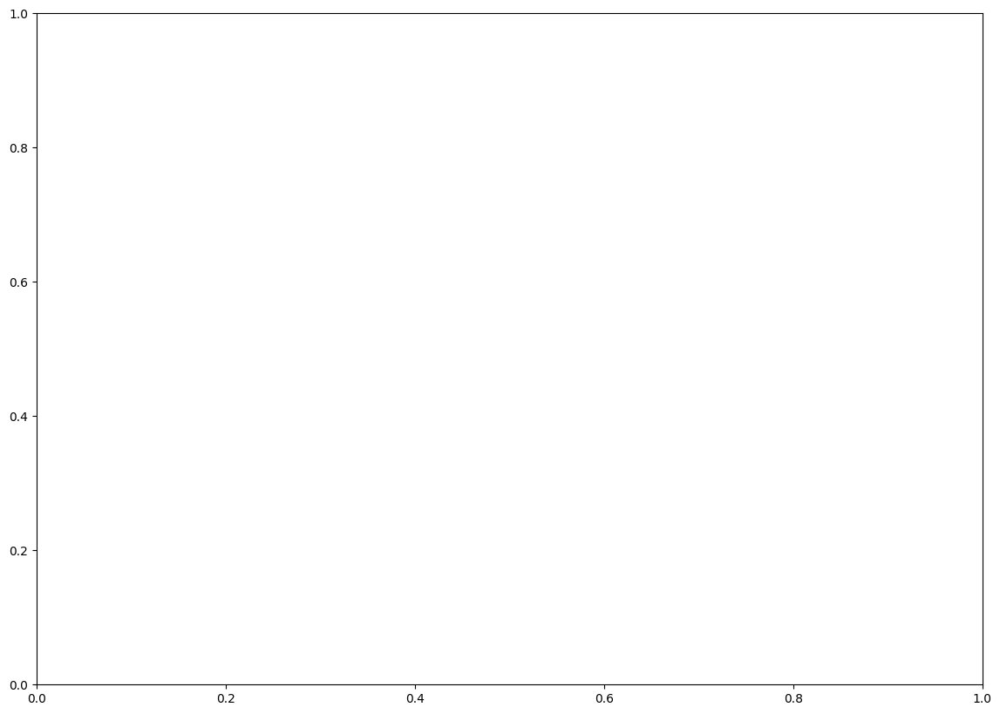

In [23]:
def plot_communities(graph, communities):
    plt.figure(figsize=(14, 10))  # Larger figure size for clarity
    pos = nx.spring_layout(graph, scale=20.0)  # Scale to spread nodes within each community

    community_pos = {}
    for idx, community in enumerate(communities):
        angle = 2 * np.pi * idx / len(communities)  # Angle to position this community's center point
        center = np.array([np.cos(angle), np.sin(angle)]) * 10  # Center points spread in a circle

        subgraph = graph.subgraph(community)
        sub_pos = nx.spring_layout(subgraph)  # Position subgraph

        for node in subgraph:
            community_pos[node] = sub_pos[node] * 2 + center  # Scale and shift positions

    colors = plt.cm.rainbow(np.linspace(0, 1, len(communities)))
    for community, color in zip(communities, colors):
        nx.draw_networkx_nodes(graph, community_pos, nodelist=community, node_color=[color], node_size=100, alpha=0.8)
    
    nx.draw_networkx_edges(graph, community_pos, alpha=0.3)
    plt.title('Community Structure Detected by Leiden Algorithm')
    plt.axis('off')  # Turn off the axis
    plt.show()

# Assuming 'graph' is your NetworkX graph object and 'communities' are from Leiden
plot_communities(yg[1992], partition)


In [9]:
import ctypes
ctypes.windll.user32.LockWorkStation()

1

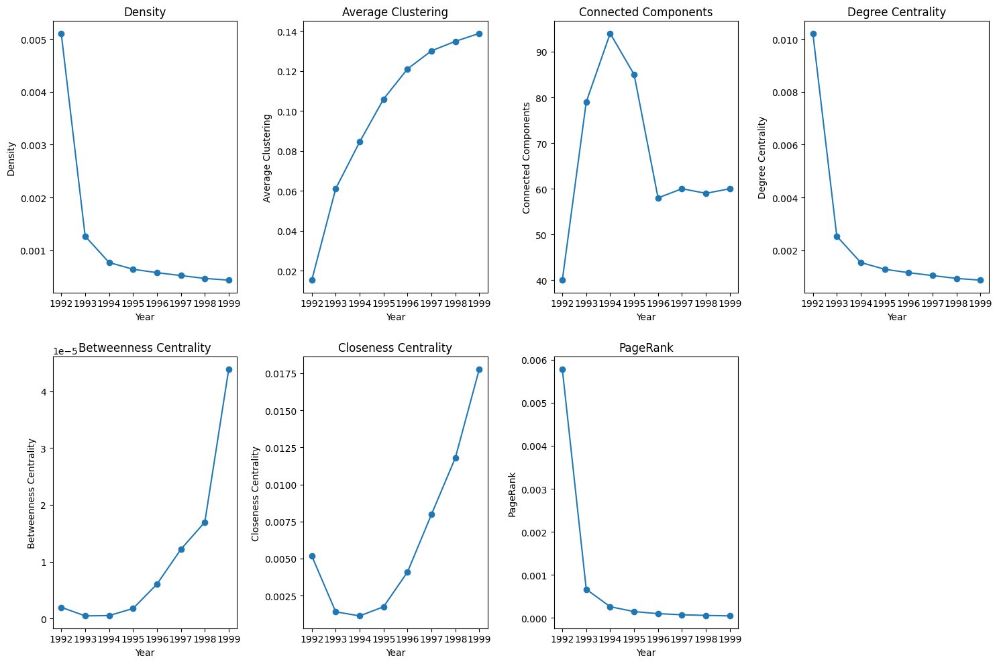

In [11]:
import os
import json
import matplotlib.pyplot as plt

def load_properties(folder_path):
    properties = {
        "density": [],
        "average_clustering": [],
        "connected_components": [],
        "degree_centrality": [],
        "betweenness_centrality": [],
        "closeness_centrality": [],
        "pagerank": []
    }
    years = []

    for filename in sorted(os.listdir(folder_path)):
        if filename.endswith('.json'):
            year = filename.split('.')[0]
            years.append(year)
            with open(os.path.join(folder_path, filename), 'r') as file:
                data = json.load(file)
                properties["density"].append(data["density"])
                properties["average_clustering"].append(data["average_clustering"])
                properties["connected_components"].append(data["connected_components"])
                properties["degree_centrality"].append(data["degree_centrality"])
                properties["betweenness_centrality"].append(data["betweenness_centrality"])
                properties["closeness_centrality"].append(data["closeness_centrality"])
                properties["pagerank"].append(data["pagerank"])
    
    return properties, years

def plot_properties(properties, years):
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 4, 1)
    plt.plot(years, properties["density"], marker='o')
    plt.title('Density')
    plt.xlabel('Year')
    plt.ylabel('Density')

    plt.subplot(2, 4, 2)
    plt.plot(years, properties["average_clustering"], marker='o')
    plt.title('Average Clustering')
    plt.xlabel('Year')
    plt.ylabel('Average Clustering')

    plt.subplot(2, 4, 3)
    plt.plot(years, properties["connected_components"], marker='o')
    plt.title('Connected Components')
    plt.xlabel('Year')
    plt.ylabel('Connected Components')

    plt.subplot(2, 4, 4)
    plt.plot(years, properties["degree_centrality"], marker='o')
    plt.title('Degree Centrality')
    plt.xlabel('Year')
    plt.ylabel('Degree Centrality')

    plt.subplot(2, 4, 5)
    plt.plot(years, properties["betweenness_centrality"], marker='o')
    plt.title('Betweenness Centrality')
    plt.xlabel('Year')
    plt.ylabel('Betweenness Centrality')

    plt.subplot(2, 4, 6)
    plt.plot(years, properties["closeness_centrality"], marker='o')
    plt.title('Closeness Centrality')
    plt.xlabel('Year')
    plt.ylabel('Closeness Centrality')

    plt.subplot(2, 4, 7)
    plt.plot(years, properties["pagerank"], marker='o')
    plt.title('PageRank')
    plt.xlabel('Year')
    plt.ylabel('PageRank')

    plt.tight_layout()
    plt.show()

def main():
    folder_path = './properties'  # Adjust the folder path if needed
    properties, years = load_properties(folder_path)
    plot_properties(properties, years)

if __name__ == "__main__":
    main()


In [13]:
import networkx as nx
from datetime import datetime, timedelta

def load_graph(edges_file, dates_file):
    """
    Loads the graph from edges and dates files.

    Args:
        edges_file (str): Path to the file containing the graph edges.
        dates_file (str): Path to the file containing the publication dates.

    Returns:
        nx.DiGraph: The directed graph with nodes annotated with publication dates.
        dict: Dictionary with node IDs as keys and datetime objects as values.
    """
    graph = nx.DiGraph()
    dates = {}

    # Load dates from the dates file
    with open(dates_file, 'r') as file:
        for line in file:
            if line.startswith('#'):
                continue
            parts = line.strip().split()
            paper_id = parts[0]
            date = parts[1]
            dates[paper_id] = datetime.strptime(date, "%Y-%m-%d")

    # Load the graph
    with open(edges_file, 'r') as file:
        for line in file:
            if line.startswith('#'):
                continue
            from_node, to_node = line.strip().split()
            if from_node in dates and to_node in dates:  # Ensure both nodes have dates
                if from_node not in graph:
                    graph.add_node(from_node, date=dates[from_node])
                if to_node not in graph:
                    graph.add_node(to_node, date=dates[to_node])
                graph.add_edge(from_node, to_node)

    return graph, dates

def create_incremental_graphs(graph, dates, num_months=36):
    """
    Creates incremental graphs for each month up to num_months.

    Args:
        graph (nx.DiGraph): The original directed graph.
        dates (dict): Dictionary of node dates.
        num_months (int): Number of months to create incremental graphs.

    Returns:
        dict: Dictionary with keys as dates and values as networkx graphs.
    """
    min_date = min(dates.values())
    graphs_dict = {}

    for month in range(num_months):
        end_date = min_date + timedelta(days=30*month)
        subgraph = nx.DiGraph()

        for node, date in dates.items():
            if date <= end_date:
                if node not in subgraph:
                    subgraph.add_node(node, date=date)

        for from_node, to_node in graph.edges:
            if from_node in subgraph and to_node in subgraph:
                subgraph.add_edge(from_node, to_node)

        graphs_dict[end_date.strftime("%Y-%m")] = subgraph

    return graphs_dict

edges_file = './data/Cit-HepPh.txt'
dates_file = './data/cit-HepPh-dates.txt'

graph, dates = load_graph(edges_file, dates_file)
incremental_graphs = create_incremental_graphs(graph, dates, num_months=36)

print(incremental_graphs)

{'1992-02': <networkx.classes.digraph.DiGraph object at 0x000001FC1ED662D0>, '1992-03': <networkx.classes.digraph.DiGraph object at 0x000001FC3CC4DB20>, '1992-04': <networkx.classes.digraph.DiGraph object at 0x000001FC3CCCC650>, '1992-05': <networkx.classes.digraph.DiGraph object at 0x000001FC3CC844A0>, '1992-06': <networkx.classes.digraph.DiGraph object at 0x000001FC3A565F10>, '1992-07': <networkx.classes.digraph.DiGraph object at 0x000001FC3CCAF6E0>, '1992-08': <networkx.classes.digraph.DiGraph object at 0x000001FC1ED66210>, '1992-09': <networkx.classes.digraph.DiGraph object at 0x000001FC1ED660C0>, '1992-10': <networkx.classes.digraph.DiGraph object at 0x000001FC3CC82B40>, '1992-11': <networkx.classes.digraph.DiGraph object at 0x000001FC1ED66270>, '1992-12': <networkx.classes.digraph.DiGraph object at 0x000001FC3CC85E20>, '1993-01': <networkx.classes.digraph.DiGraph object at 0x000001FC1ED66060>, '1993-02': <networkx.classes.digraph.DiGraph object at 0x000001FC1ED65FD0>, '1993-03': 

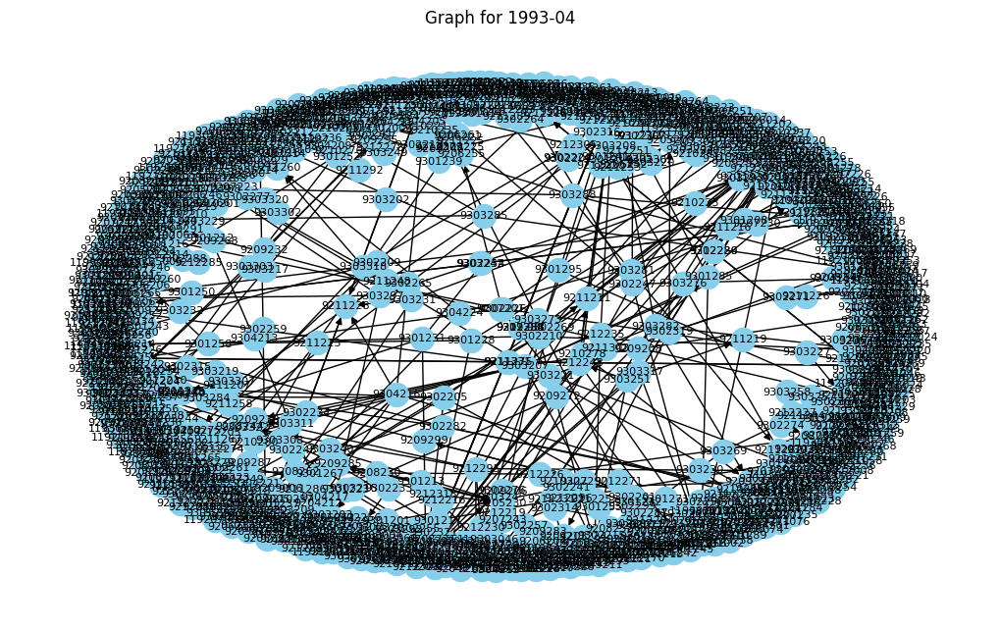

In [14]:
import networkx as nx
import matplotlib.pyplot as plt

def visualize_graph(incremental_graphs, date_key):
    """
    Visualize a graph for a particular date key.

    Args:
        incremental_graphs (dict): Dictionary where keys are date strings and values are corresponding graphs.
        date_key (str): The date key for which the graph needs to be visualized.
    """
    graph = incremental_graphs.get(date_key, None)
    if graph is None:
        print("No graph available for the specified date.")
        return

    plt.figure(figsize=(10, 6))
    pos = nx.spring_layout(graph)  # Positions for all nodes
    nx.draw(graph, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8)
    plt.title(f"Graph for {date_key}")
    plt.show()

visualize_graph(incremental_graphs, '1993-04')


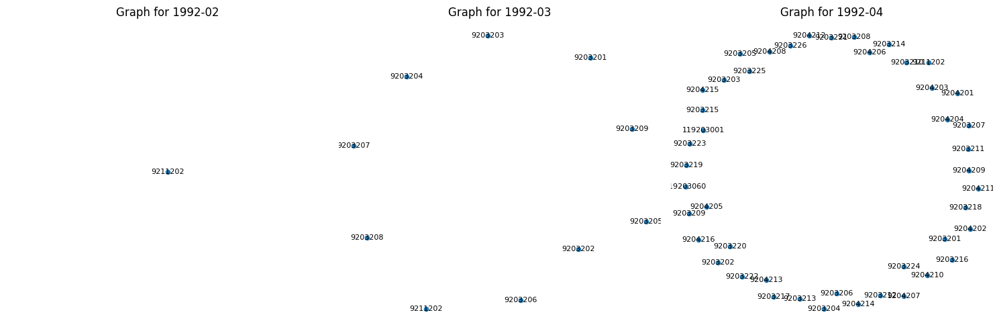